In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

from ensemble import EnsembleModel
from tools import choose_gpu

model_paths = [
    'E-brains18=0314-180735',
    'E-brains18=0314-182316',
    'E-brains18=0314-184617',
    'E-brains18=0314-184900',
    'E-brains18=0314-191031',
    'E-brains18=0314-191616',
    'E-brains18=0314-193439',
    'E-brains18=0314-194709',
    'E-brains18=0314-195238',
    'E-brains18=0314-200317',
    'E-brains18=0314-201357',
    'E-brains18=0314-203550',
    'E-brains18=0314-205210',
    'E-brains18=0314-212917',
    'E-brains18=0314-213325',
    'E-brains18=0314-214800',
    'E-brains18=0314-220258',
    'E-brains18=0314-221005'
]
model_paths = ['exp/{}/model.pt'.format(x) for x in model_paths]
print(len(model_paths))
print(model_paths)

ensemble_model = EnsembleModel(model_paths)


18
['exp/E-brains18=0314-180735/model.pt', 'exp/E-brains18=0314-182316/model.pt', 'exp/E-brains18=0314-184617/model.pt', 'exp/E-brains18=0314-184900/model.pt', 'exp/E-brains18=0314-191031/model.pt', 'exp/E-brains18=0314-191616/model.pt', 'exp/E-brains18=0314-193439/model.pt', 'exp/E-brains18=0314-194709/model.pt', 'exp/E-brains18=0314-195238/model.pt', 'exp/E-brains18=0314-200317/model.pt', 'exp/E-brains18=0314-201357/model.pt', 'exp/E-brains18=0314-203550/model.pt', 'exp/E-brains18=0314-205210/model.pt', 'exp/E-brains18=0314-212917/model.pt', 'exp/E-brains18=0314-213325/model.pt', 'exp/E-brains18=0314-214800/model.pt', 'exp/E-brains18=0314-220258/model.pt', 'exp/E-brains18=0314-221005/model.pt']
0 [10627, 601, 876, 4121, 1503, 1188, 1503, 2576]


In [2]:
ensemble_model.load_models()

Model loaded from exp/E-brains18=0314-180735/model.pt
Model loaded from exp/E-brains18=0314-182316/model.pt
Model loaded from exp/E-brains18=0314-184617/model.pt
Model loaded from exp/E-brains18=0314-184900/model.pt
Model loaded from exp/E-brains18=0314-191031/model.pt
Model loaded from exp/E-brains18=0314-191616/model.pt
Model loaded from exp/E-brains18=0314-193439/model.pt
Model loaded from exp/E-brains18=0314-194709/model.pt
Model loaded from exp/E-brains18=0314-195238/model.pt
Model loaded from exp/E-brains18=0314-200317/model.pt
Model loaded from exp/E-brains18=0314-201357/model.pt
Model loaded from exp/E-brains18=0314-203550/model.pt
Model loaded from exp/E-brains18=0314-205210/model.pt
Model loaded from exp/E-brains18=0314-212917/model.pt
Model loaded from exp/E-brains18=0314-213325/model.pt
Model loaded from exp/E-brains18=0314-214800/model.pt
Model loaded from exp/E-brains18=0314-220258/model.pt
Model loaded from exp/E-brains18=0314-221005/model.pt
M (number of models): 18


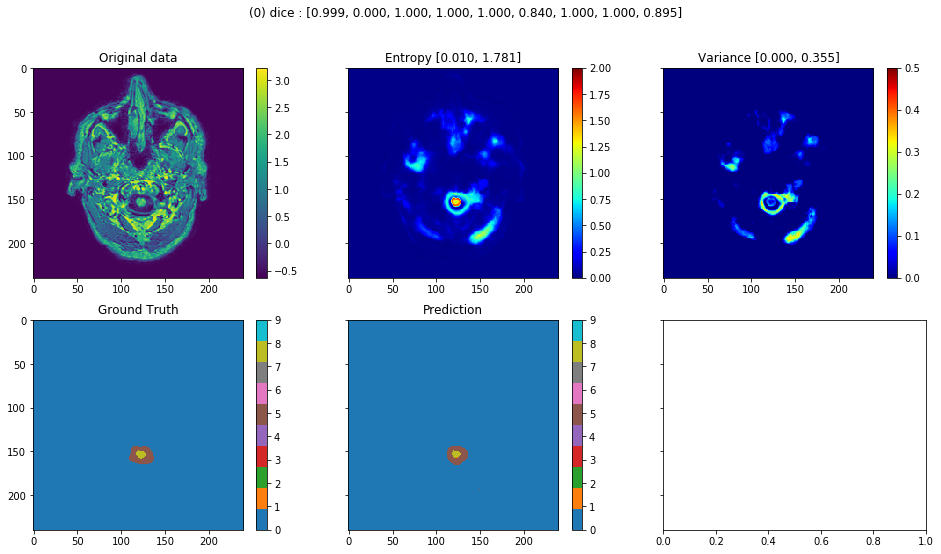

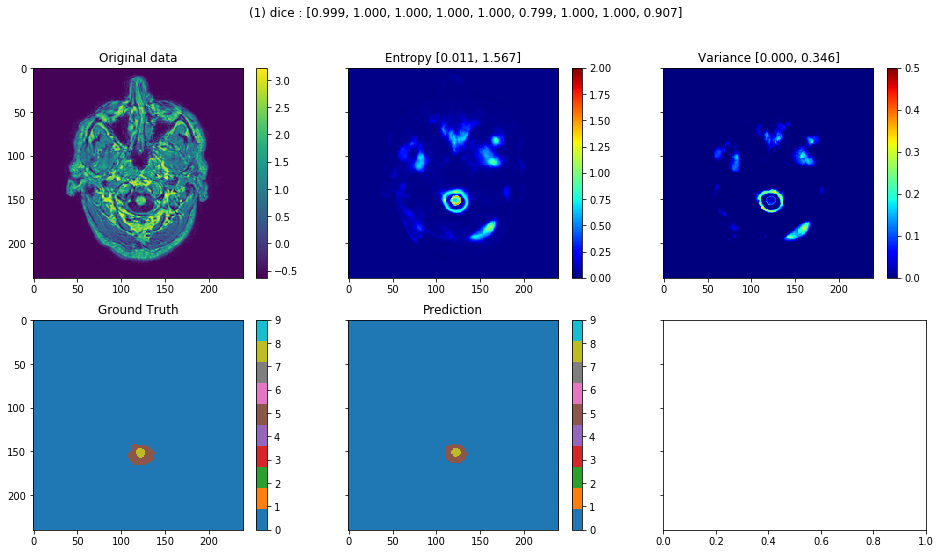

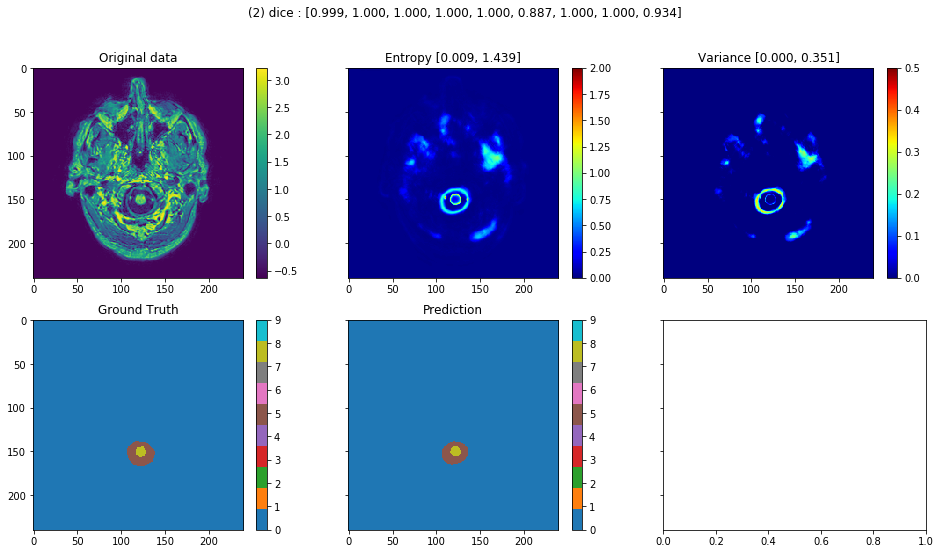

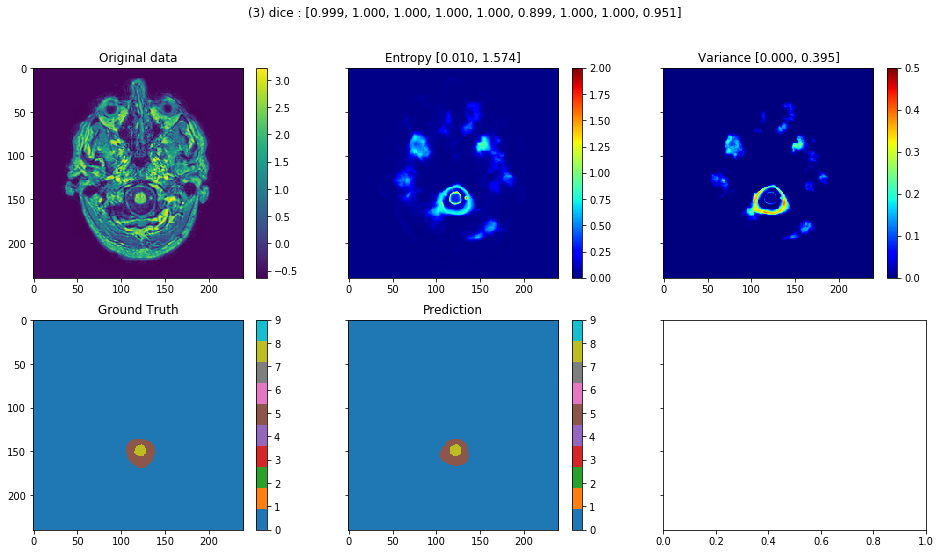

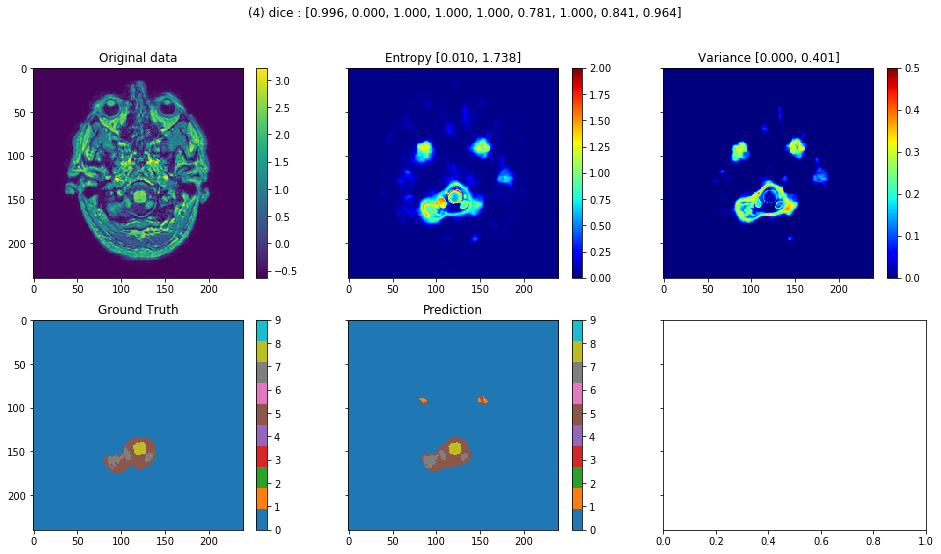

...

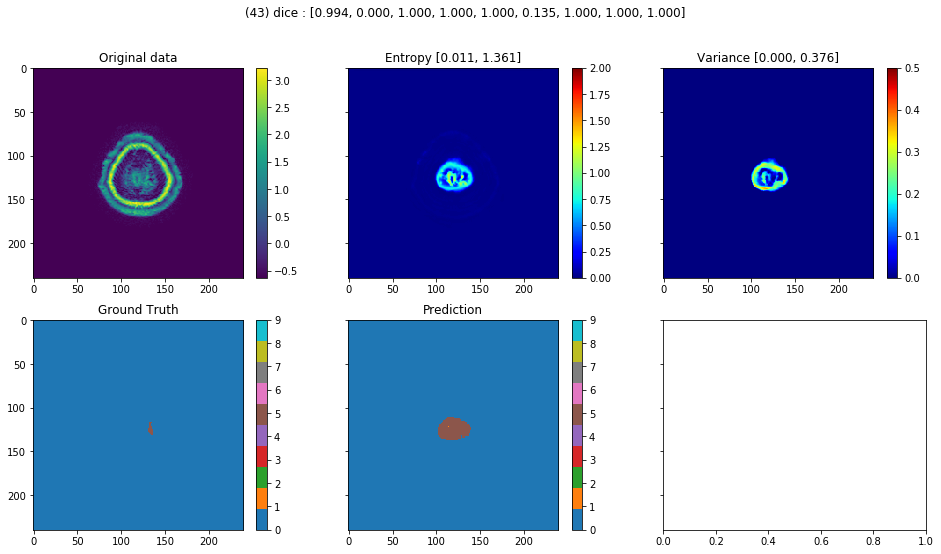

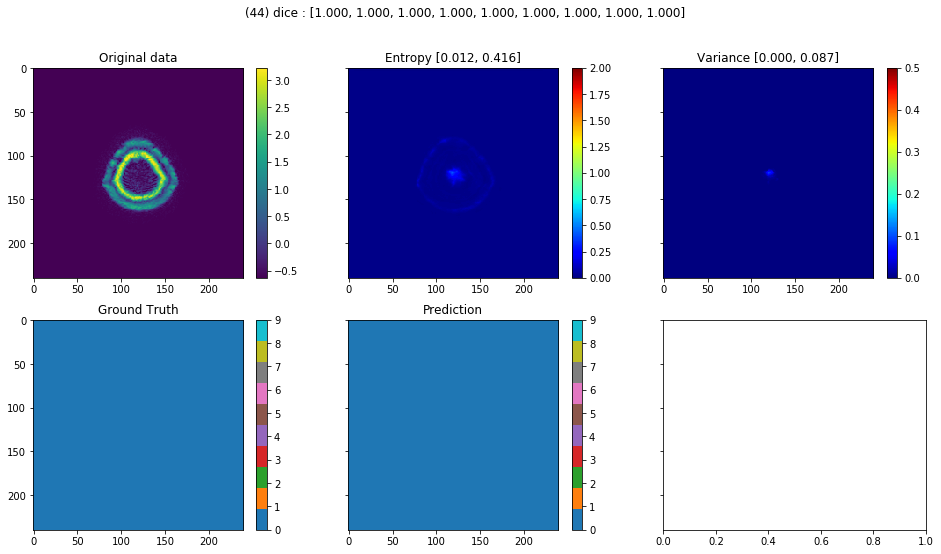

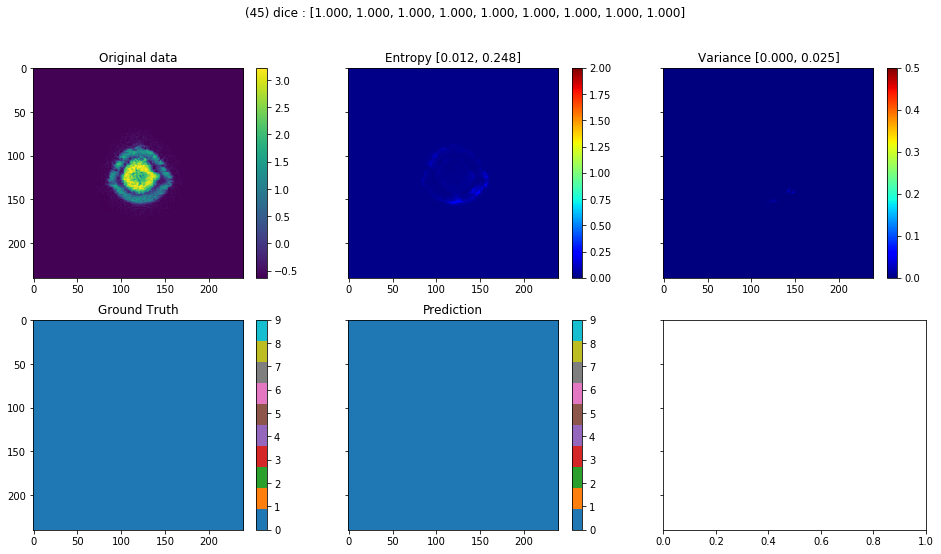

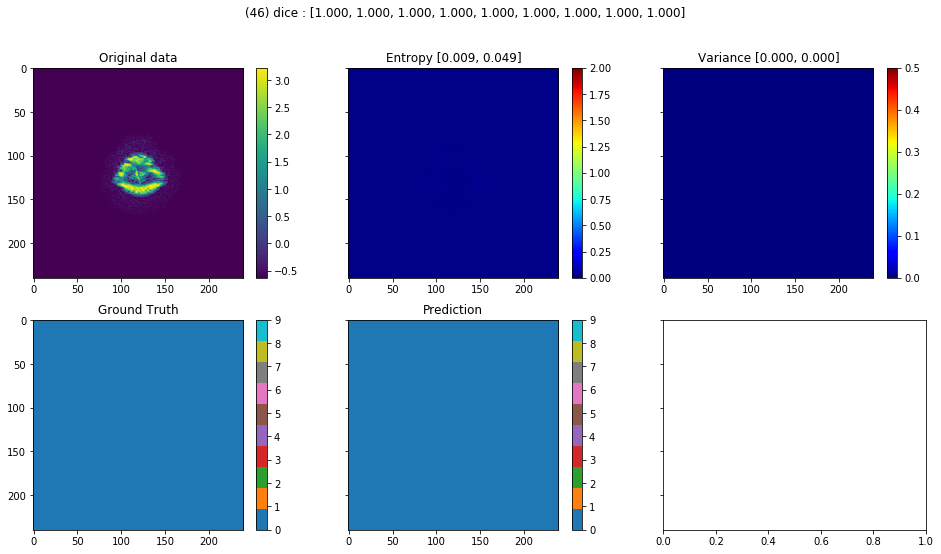

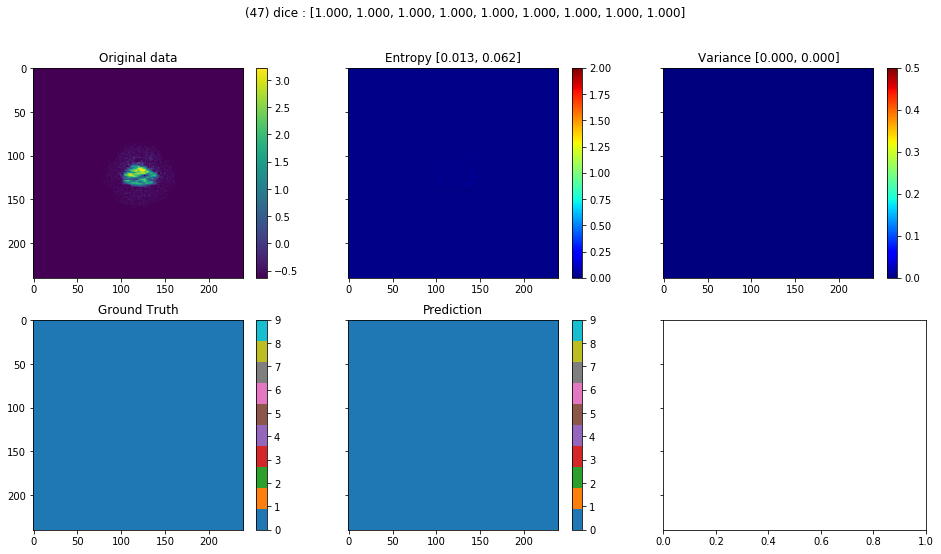

In [4]:
def show_result(data, ids):
    for i in ids:
        ensemble_model.predict(data[i][2], data[i][3], i)
show_result(ensemble_model.val_data, range(len(ensemble_model.val_data)))
# show_result(ensemble_model.val_data, [20])


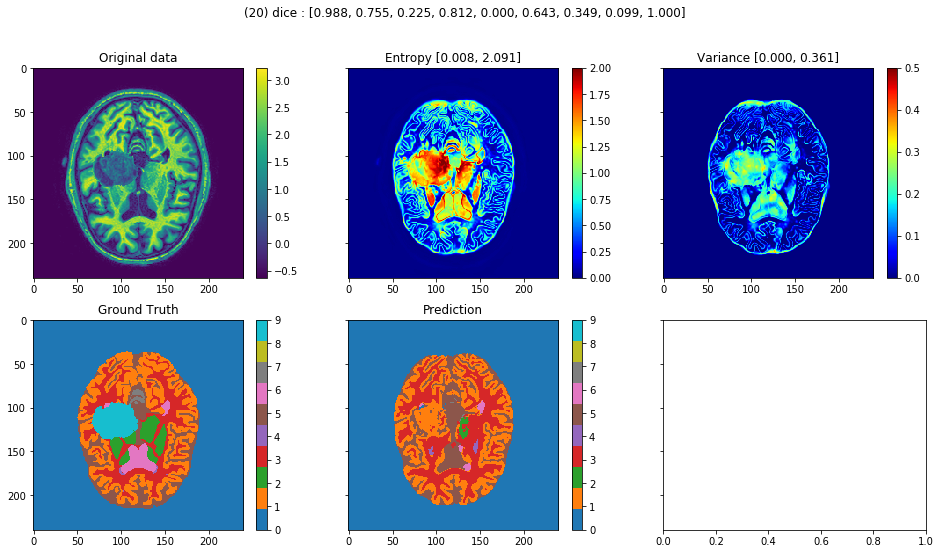

In [6]:
def show_result(data, ids):
    for i in ids:
        ensemble_model.predict(data[i][2], data[i][3], i)
# show_result(ensemble_model.val_data, range(len(ensemble_model.val_data)))
show_result(ensemble_model.val_data, [20])

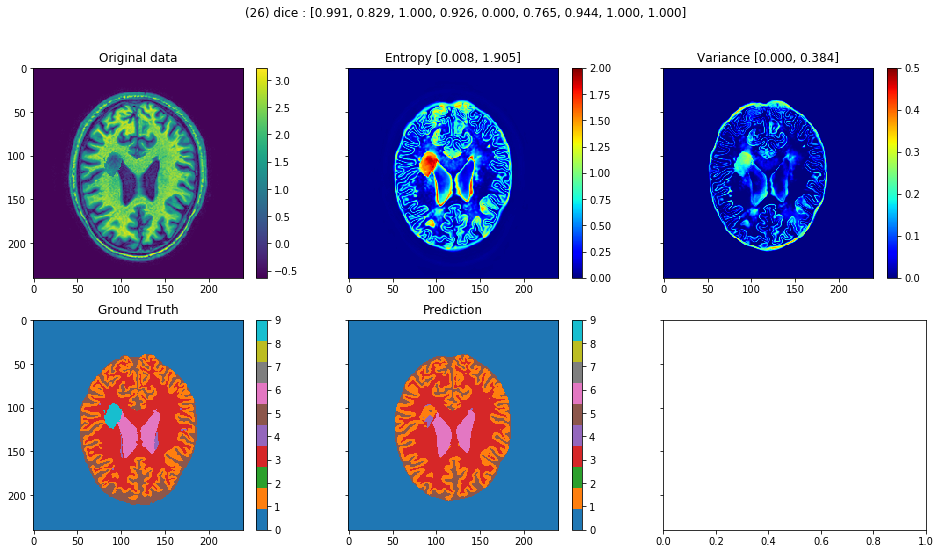

In [7]:
def show_result(data, ids):
    for i in ids:
        ensemble_model.predict(data[i][2], data[i][3], i)
# show_result(ensemble_model.val_data, range(len(ensemble_model.val_data)))
show_result(ensemble_model.val_data, [26])

In [ ]:
import numpy as np
# total_dices = np.zeros(ensemble_model.n_classes)
def eval_dices(data, ids):
    total_dices = np.zeros(ensemble_model.n_classes)
    for i in ids:
        total_dices += ensemble_model.predict(data[i][2], data[i][3])
    return total_dices / (len(ids))

train_dices = eval_dices(ensemble_model.train_data, range(len(ensemble_model.train_data)))
val_dices = eval_dices(ensemble_model.val_data, range(len(ensemble_model.val_data)))
print(train_dices)
print(val_dices)

In [ ]:
from op import arr2str
print("Class     : {}".format(['{:3d}'.format(x) for x in range(0, ensemble_model.n_classes)]))
print("Train dice: {}".format(arr2str(train_dices)))
print("Val   dice: {}".format(arr2str(val_dices)))